# Problem Statement

The **Paramedic Service Incident Response Department** is encountering challenges in effectively responding to emergency calls during specific times of day and within certain geographical areas.

To enhance **operational efficiency** and **optimize resource allocation**, a comprehensive analysis of incident patterns is necessary.


---
# Key Objectives

## 1. Analyze Incident Volume by Time of Day
- Identify which parts of the day (e.g., morning, afternoon, night) have the highest number of incident calls.

## 2. Determine the Busiest Days of the Year
- Pinpoint specific dates or days when paramedic services are most in demand.

## 3. Understand Annual and Seasonal Trends
- Analyze incident call trends across months and seasons to detect any recurring patterns or spikes in demand.

## 4. Locate High-Demand Areas (FSAs)
- Discover Forward Sortation Areas (FSAs) with the highest number of incident calls.

## 5. Support Resource Planning and Decision-Making
- Use data-driven insights to recommend resource redistribution, scheduling adjustments, or new station locations.

## 6. Temporal Analysis
- Plot number of dispatches per day.
- Identify peak dispatch hours and busiest days.
- Compare AM vs PM dispatch volumes.

---
# Data Analysis Life Cycle (Steps involve):

# Phase 1: Data Understanding
---
- Load the dataset and inspect its structure.
- Understand what each column represents and its relevance to the analysis


In [7]:
import pandas as pd
import scipy.stats as stats
import numpy as np
import random
from datetime import time
import seaborn as sns
import folium
import csv
import geopandas as gpd
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import re
from itertools import chain

file = "data/paramedic-services-incident-data-2024.xlsx"

paramedic_data = pd.read_excel(file)
paramedic_data

,ID,Dispatch_Time,Incident_Type,Priority_Number,Units_Arrived_At_Scene,Forward_Sortation_Area
0,8307892,2024-01-01 00:00:32,Medical,1,1,M9R
1,8307894,2024-01-01 00:02:10,Medical,5,1,M1L
2,8307895,2024-01-01 00:02:40,Medical,1,1,M9V
3,8307896,2024-01-01 00:03:58,Medical,1,1,M5B
4,8307897,2024-01-01 00:05:52,Medical,5,1,M5A
...,...,...,...,...,...,...
313090,8785435,2024-12-31 23:54:29,-,1,1,M5A
313091,8785436,2024-12-31 23:54:32,-,5,0,M6K
313092,8785437,2024-12-31 23:55:34,-,9,1,M1N
313093,8785438,2024-12-31 23:56:17,-,1,1,M5R


# Phase 2: Data Cleaning & Preparation
-------------------------------------
- Check for missing values, duplicates, and inconsistent entries.
- Standardize column names and ensure correct data types.


In [9]:
# standardize the column names
paramedic_data.columns = [col.lower() for col in paramedic_data.columns]

# Rename columns
paramedic_data = paramedic_data.rename(columns={'forward_sortation_area': 'FSA'})

paramedic_data.info()


all_duplicate_occurrences = paramedic_data[paramedic_data.duplicated(keep=False)]
print("")
print("______________________________________________________________________")
print("")
print(f"Number of duplicate records: {len(all_duplicate_occurrences)}")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 313095 entries, 0 to 313094
Data columns (total 6 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      313095 non-null  int64         
 1   dispatch_time           313095 non-null  datetime64[ns]
 2   incident_type           313095 non-null  object        
 3   priority_number         313095 non-null  int64         
 4   units_arrived_at_scene  313095 non-null  int64         
 5   FSA                     313095 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 14.3+ MB

______________________________________________________________________

Number of duplicate records: 0


In [11]:
# Checking unique values of columns

# Categorical values --> incident_type, priority_number
# print(paramedic_data.incident_type.unique())     
# print(paramedic_data.priority_number.unique())
# print(paramedic_data.units_arrived_at_scene.unique())
# print(paramedic_data.FSA.unique())


# There are some values in incident_type and FSA with '-' values , Since we can not do any computation
# We have to drop or fill n/a for those columns
paramedic_data['incident_type'] = paramedic_data['incident_type'].apply(lambda x: 'N/A' if x == '-' else x)
paramedic_data['FSA'] = paramedic_data['FSA'].apply(lambda x: 'N/A' if x == '-' else x)

# Also since we will be analyzing only the Toronto FSA, we filter FSA's starting with lette M Only!
paramedic_data = paramedic_data[paramedic_data['FSA'].str.contains(r'^M', case=False, na=False)]


paramedic_data
# Yes --> looks good!

,id,dispatch_time,incident_type,priority_number,units_arrived_at_scene,FSA
0,8307892,2024-01-01 00:00:32,Medical,1,1,M9R
1,8307894,2024-01-01 00:02:10,Medical,5,1,M1L
2,8307895,2024-01-01 00:02:40,Medical,1,1,M9V
3,8307896,2024-01-01 00:03:58,Medical,1,1,M5B
4,8307897,2024-01-01 00:05:52,Medical,5,1,M5A
...,...,...,...,...,...,...
313090,8785435,2024-12-31 23:54:29,N/A,1,1,M5A
313091,8785436,2024-12-31 23:54:32,N/A,5,0,M6K
313092,8785437,2024-12-31 23:55:34,N/A,9,1,M1N
313093,8785438,2024-12-31 23:56:17,N/A,1,1,M5R


# Phase 3: Data Enrichment (Feature Engineering)
-----------------------------------------------
- Create new useful columns to support analysis:
  - 'month': Extract from datetime.
  - 'day_name': Name of the day (e.g., Monday).
  - 'time': time.
  - 'day_time': Categorical time segment (Morning, Afternoon, Evening, Night).


In [14]:
# Dictionary to map month numbers to month names
month_to_rename = {
    1: "January", 2: "February", 3: "March", 4: "April", 5: "May", 6: "June",
    7: "July", 8: "August", 9: "September", 10: "October", 11: "November", 12: "December"
}

# Extract month number from dispatch_time and assign it to 'month' column
paramedic_data['month'] = paramedic_data['dispatch_time'].dt.month

# Map the month numbers to month names using the dictionary
paramedic_data['month'] = paramedic_data['month'].map(month_to_rename)

# Month to order
month_order = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

# Categorize months 
paramedic_data['month'] = pd.Categorical(paramedic_data['month'], categories = month_order, ordered=True)


# Extract only the day component from dispatch_time and assign to day column
paramedic_data['day'] = paramedic_data['dispatch_time'].dt.day


# day_name to order list
day_name_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Extract only the day_name component from dispatch_time and assign to 'day_name' column
paramedic_data['day_name'] = paramedic_data['dispatch_time'].dt.day_name()

# Categorize day_name
paramedic_data['day_name'] = pd.Categorical(paramedic_data['day_name'], categories=day_name_order, ordered=True)


# Extract only the time component from dispatch_time and assign to time column
paramedic_data['time'] = paramedic_data['dispatch_time'].dt.time

# Create a column for day time AM or PM
paramedic_data['day_time'] = paramedic_data['time'].apply(lambda x: "am" if x >= time(0,0) and x < time(12,0) else "pm")


# Time Categories (Aligned to TPS operational rhythms):
# Morning   06:00 – 11:59   Early calls ramping up
# Afternoon 12:00 – 17:59   Midday / peak operations
# Evening   18:00 – 23:59   Evening activity
# Night     00:00 – 05:59   Overnight quiet period

def day_time(a_time):
    if time(6, 0) <= a_time < time(12, 0):
        return "Morning"
    elif time(12, 0) <= a_time < time(18, 0):
        return "Afternoon"
    elif time(18, 0) <= a_time <= time(23, 59):
        return "Evening"
    else:
        # anything from 00:00 up to (but not including) 06:00
        return "Night"

# Apply the day_time function to the 'time' column to create a 'time_category'
paramedic_data['time_category'] = paramedic_data['time'].apply(lambda x: day_time(x))

# Map priority numbers to descriptive priority levels
priority_map = {
    1: "Delta", 3: "Charlie", 4: "Bravo", 5: "Alpha", 9: "Echo",
    11: "Alpha1", 12: "Alpha2", 13: "Alpha3", 14: "Code2"
}
paramedic_data['priority_number'] = paramedic_data['priority_number'].map(priority_map)

paramedic_data = paramedic_data.rename(columns={'priority_number': 'priority_category'})


# Print the first 10 rows of the DataFrame in full detail
print(paramedic_data.head(10).to_string())

        id       dispatch_time incident_type priority_category  units_arrived_at_scene  FSA    month  day day_name      time day_time time_category
0  8307892 2024-01-01 00:00:32       Medical             Delta                       1  M9R  January    1   Monday  00:00:32       am         Night
1  8307894 2024-01-01 00:02:10       Medical             Alpha                       1  M1L  January    1   Monday  00:02:10       am         Night
2  8307895 2024-01-01 00:02:40       Medical             Delta                       1  M9V  January    1   Monday  00:02:40       am         Night
3  8307896 2024-01-01 00:03:58       Medical             Delta                       1  M5B  January    1   Monday  00:03:58       am         Night
4  8307897 2024-01-01 00:05:52       Medical             Alpha                       1  M5A  January    1   Monday  00:05:52       am         Night
5  8307899 2024-01-01 00:06:53       Medical           Charlie                       1  M3N  January    1   Mond

In [18]:
# Further enrichment -> Assigning FSA with their corresponding Bourogh and Neighbourhood names
# Taken From --> https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M

headers = []
for i in range(9):
    headers.append(f"M{i+1}_")

df = pd.read_html('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M',header=None)[0]
     

df.columns = headers

master_array = []
for col in df.columns:
    helper = df[col].tolist()
    helper2 = [i.strip() for i in helper if "Not assigned" not in i]
    master_array.append(helper2)


# 1) flatten the master array into one list of strings
flat = list(chain.from_iterable(master_array))

# 2) compile a regex that grabs:
pattern = re.compile(
    r'^'                  
    r'([A-Za-z]\d[A-Za-z])' 
    r'\s+'               
    r'([^()]+?)'         
    r'(?:\s+(\(.+))?'     
    r'$'                  
)

# 3) build a list of dicts, then turn into a DataFrame
rows = []
for s in flat:
    m = pattern.match(s)
    if not m:
        continue
    fsa, borough, neigh = m.groups()
    rows.append({
        'FSA': fsa,
        'borough': borough.strip(),
        'neighborhood': neigh
    })

toronto_fsa_names = pd.DataFrame(rows, columns=['FSA','borough','neighborhood'])
toronto_fsa_names = (toronto_fsa_names.drop_duplicates('FSA').set_index('FSA')[['borough','neighborhood']])
toronto_fsa_names['neighborhood'] = toronto_fsa_names['neighborhood'].astype("string")
toronto_fsa_names['neighborhood'] = toronto_fsa_names['neighborhood'].apply(lambda x: x.replace("(", "").replace(")","").strip() if pd.notnull(x) else x)
toronto_fsa_names

,borough,neighborhood
FSA,,
M1B,Scarborough,Malvern / Rouge
M1C,Scarborough,Rouge Hill / Port Union / Highland Creek
M1E,Scarborough,Guildwood / Morningside / West Hill
M1G,Scarborough,Woburn
M1H,Scarborough,Cedarbrae
...,...,...
M9N,York,Weston
M9P,Etobicoke,Westmount
M9R,Etobicoke,Kingsview Village / St. Phillips / Martin Grov...


In [20]:
# Mapping FSA's with their associated Borough and Neighbourhoods
paramedic_data['borough'] = paramedic_data['FSA'].map(toronto_fsa_names['borough'])
paramedic_data['neighborhood'] = paramedic_data['FSA'].map(toronto_fsa_names['neighborhood'])
paramedic_data

,id,dispatch_time,incident_type,priority_category,units_arrived_at_scene,FSA,month,day,day_name,time,day_time,time_category,borough,neighborhood
0,8307892,2024-01-01 00:00:32,Medical,Delta,1,M9R,January,1,Monday,00:00:32,am,Night,Etobicoke,Kingsview Village / St. Phillips / Martin Grov...
1,8307894,2024-01-01 00:02:10,Medical,Alpha,1,M1L,January,1,Monday,00:02:10,am,Night,Scarborough,Golden Mile / Clairlea / Oakridge
2,8307895,2024-01-01 00:02:40,Medical,Delta,1,M9V,January,1,Monday,00:02:40,am,Night,Etobicoke,South Steeles / Silverstone / Humbergate / Jam...
3,8307896,2024-01-01 00:03:58,Medical,Delta,1,M5B,January,1,Monday,00:03:58,am,Night,Downtown Toronto,"Garden District, Ryerson"
4,8307897,2024-01-01 00:05:52,Medical,Alpha,1,M5A,January,1,Monday,00:05:52,am,Night,Downtown Toronto,Regent Park / Harbourfront
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313090,8785435,2024-12-31 23:54:29,N/A,Delta,1,M5A,December,31,Tuesday,23:54:29,pm,Evening,Downtown Toronto,Regent Park / Harbourfront
313091,8785436,2024-12-31 23:54:32,N/A,Alpha,0,M6K,December,31,Tuesday,23:54:32,pm,Evening,West Toronto,Brockton / Parkdale Village / Exhibition Place
313092,8785437,2024-12-31 23:55:34,N/A,Echo,1,M1N,December,31,Tuesday,23:55:34,pm,Evening,Scarborough,Birch Cliff / Cliffside West
313093,8785438,2024-12-31 23:56:17,N/A,Delta,1,M5R,December,31,Tuesday,23:56:17,pm,Evening,Central Toronto,The Annex / North Midtown / Yorkville


In [24]:
# Checking if the mapping was compiled correctly 
FSA_prob = paramedic_data[paramedic_data.borough.isnull()].value_counts()
FSA_prob
# looks good --> let's move on!

Series([], Name: count, dtype: int64)

# Phase 4, 5: Exploratory Data Analysis (EDA), Insight Generation
-----------------------------------------
- Visualize and analyze call distribution by:
  - Time of day
  - Day of week
  - Month/season
  - Forward Sortation Area (FSA)
- Identify peak demand periods and locations.
----------------------------
- Summarize key findings (e.g., busiest areas, peak hours).
- Assess current resource deployment relative to demand.

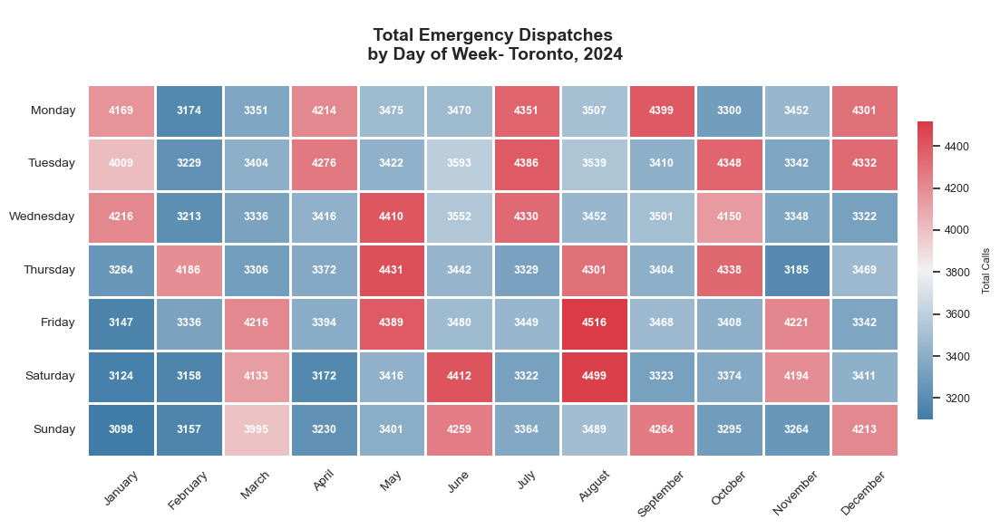

In [27]:
# Visualize the total daily trend over the year. 

month_day_trend = paramedic_data.groupby(['month', 'day_name'], observed=True)['id'].count().reset_index(name='total_count')

pivot = month_day_trend.pivot(index="day_name", columns="month", values="total_count")


# 1. Crisp background
sns.set_theme(style="whitegrid")

# 2. Diverging palette
cmap = sns.diverging_palette(240, 10, n=9, as_cmap=True)

plt.figure(figsize=(12, 6))

# 3. Heatmap with vertical colorbar on the side
ax = sns.heatmap(
    pivot,
    annot=True,
    fmt="d",
    linewidths=2,
    linecolor="white",
    cmap=cmap,
    cbar_kws={
        "shrink": 0.8,
        "pad": 0.02,          
        "label": "Total Calls"
    },
    annot_kws={
        "fontsize": 9,
        "fontweight": "bold"
    }
)

# 4. Tidy up the colorbar ticks & label size
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=9)
cbar.ax.yaxis.set_label_position("right")
cbar.ax.yaxis.tick_right()
cbar.set_label("Total Calls", fontsize=8, labelpad=10)

# 5. Auto‑contrast annotations
thresh = pivot.values.max() / 2
for t in ax.texts:
    t.set_color("white" if int(t.get_text()) > thresh else "black")

# 6. Title & axis styling
ax.set_title(
    "\n Total Emergency Dispatches \n by Day of Week- Toronto, 2024",
    fontsize=14,
    fontweight="bold",
    pad=20
)
ax.tick_params(axis="x", rotation=45, labelsize=10)
ax.set_xlabel("")
ax.tick_params(axis="y", rotation=0,  labelsize=10)
ax.set_ylabel("")

# 7. Clean up
sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

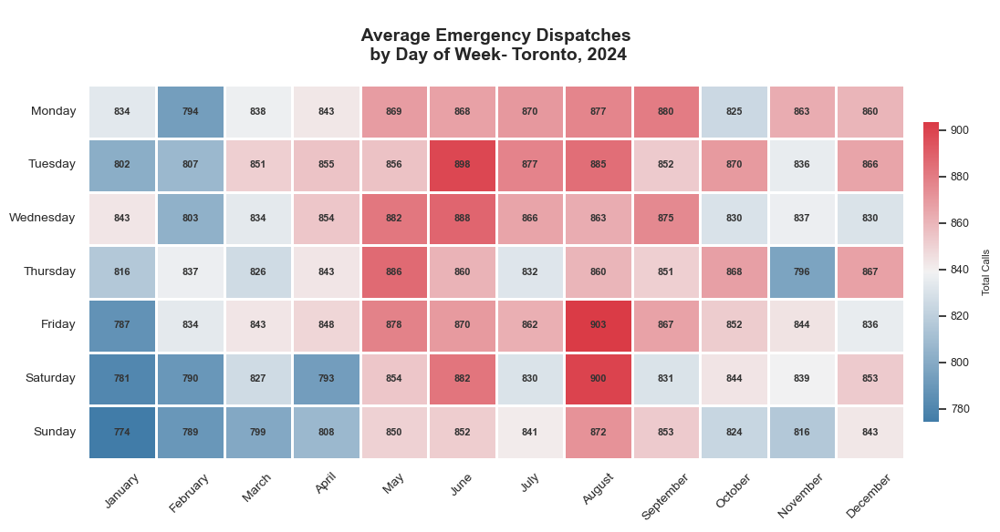

In [29]:
# get unique calendar dates per month & weekday
unique_days = (
    paramedic_data[['month','day', 'day_name']]
    .drop_duplicates(subset=['month', 'day'])
)

# count how many of each weekday occur in each month
day_counts_in_month = (
    unique_days
    .groupby(['month', 'day_name'], observed=True)
    .size()
    .reset_index(name='count_in_month')
)

# pivot to matrix of weekday (rows) × month (cols) with counts
day_counts_in_month_pivot = day_counts_in_month.pivot(
    index="day_name",
    columns="month",
    values="count_in_month"
)

# divide raw totals (pivot) by day counts → average per weekday
daily_average_dispatch = (
    pivot
    .div(day_counts_in_month_pivot) 
    .fillna(0)                        
)

# 1. Crisp background
sns.set_theme(style="whitegrid")  

# 2. Diverging palette
cmap = sns.diverging_palette(240, 10, n=9, as_cmap=True) 

plt.figure(figsize=(12, 6))  

# 3. Heatmap with vertical colorbar on the side
ax = sns.heatmap(
    daily_average_dispatch,
    annot=True,               
    fmt=".0f",               
    linewidths=2,            
    linecolor="white",        
    cmap=cmap,               
    cbar_kws={                
        "shrink": 0.8,
        "pad": 0.02,
        "label": "Total Calls"
    },
    annot_kws={               
        "fontsize": 8,
        "fontweight": "bold",
        "color": "#333333"
    }
)

# 4. Tidy up the colorbar ticks & label size
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=9)                 
cbar.ax.yaxis.set_label_position("right")       
cbar.ax.yaxis.tick_right()                       
cbar.set_label("Total Calls", fontsize=8, labelpad=10)  

# 5. Title & axis styling
ax.set_title(
    "\n Average Emergency Dispatches \n by Day of Week- Toronto, 2024",
    fontsize=14,
    fontweight="bold",
    pad=20                 # spacing above the title
)
ax.tick_params(axis="x", rotation=45, labelsize=10)  
ax.set_xlabel("")                                     
ax.tick_params(axis="y", rotation=0,  labelsize=10)  
ax.set_ylabel("")                                     

# 6. Clean up
sns.despine(left=True, bottom=True)  
plt.tight_layout()                   
plt.show()                         


In [31]:
# Weekly Average Calculation
print("The weekly average per day of the week: ")
print("______________________________________\n")
for index in daily_average_dispatch.index.tolist():
    print(f"{index}: {daily_average_dispatch.loc[index].mean():.0f}")

The weekly average per day of the week: 
______________________________________

Monday: 852
Tuesday: 855
Wednesday: 851
Thursday: 845
Friday: 852
Saturday: 835
Sunday: 827


In [33]:
# Group by month and compute all of our metrics
aggregated_dispatch_data = paramedic_data.groupby('month', observed=True).agg(
    total_count = ('id', 'count'),
    day_in_month = ('day', 'max'),
    day_time_highest = ('day_time', lambda x: x.value_counts().idxmax()),
    day_highest = ('day_name', lambda x: x.value_counts().idxmax()),
    total_count_day_highest = ('day_name', lambda x: x.value_counts().max()),
    time_category_highest = ('time_category', lambda x: x.value_counts().idxmax()),
    priority_category_highest = ('priority_category', lambda x: x.value_counts().idxmax()),
    incident_type_highest = ('incident_type', lambda x: x.value_counts().idxmax()) 
).assign(daily_avg_dispatch = lambda df: (df['total_count'] / df['day_in_month']).round(0)).reset_index()

# Print The Report
aggregated_dispatch_data


,month,total_count,day_in_month,day_time_highest,day_highest,total_count_day_highest,time_category_highest,priority_category_highest,incident_type_highest,daily_avg_dispatch
0,January,25027,31,pm,Wednesday,4216,Afternoon,Delta,Medical,807.0
1,February,23453,29,pm,Thursday,4186,Afternoon,Delta,Medical,809.0
2,March,25741,31,pm,Friday,4216,Afternoon,Delta,Medical,830.0
3,April,25074,30,pm,Tuesday,4276,Afternoon,Delta,Medical,836.0
4,May,26944,31,pm,Thursday,4431,Afternoon,Delta,Medical,869.0
5,June,26208,30,pm,Saturday,4412,Afternoon,Delta,Medical,874.0
6,July,26531,31,pm,Tuesday,4386,Afternoon,Delta,Medical,856.0
7,August,27303,31,pm,Friday,4516,Afternoon,Delta,Medical,881.0
8,September,25769,30,pm,Monday,4399,Afternoon,Delta,Medical,859.0
9,October,26213,31,pm,Tuesday,4348,Afternoon,Delta,Medical,846.0


In [35]:
week_day_highest = aggregated_dispatch_data[['month', 'day_highest', 'total_count_day_highest']]
week_day_highest = week_day_highest.sort_values('total_count_day_highest', ascending=False)
week_day_highest

,month,day_highest,total_count_day_highest
7,August,Friday,4516
4,May,Thursday,4431
5,June,Saturday,4412
8,September,Monday,4399
6,July,Tuesday,4386
9,October,Tuesday,4348
11,December,Tuesday,4332
3,April,Tuesday,4276
10,November,Friday,4221
0,January,Wednesday,4216


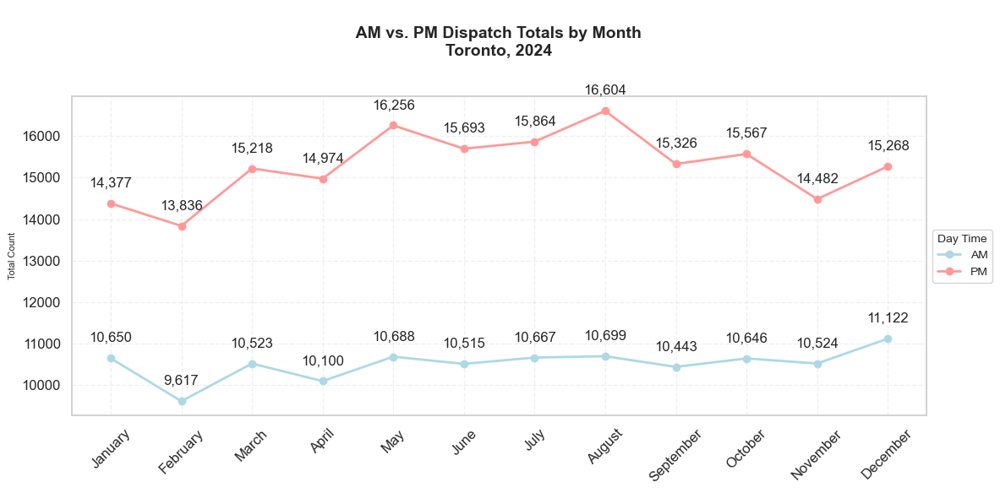

In [37]:
day_time_comparison = paramedic_data.groupby(['month','day_time'], observed=True).size().reset_index(name='total_count')

pivot = day_time_comparison.pivot(index='month', columns='day_time', values='total_count')

# Create the figure
fig, ax = plt.subplots(figsize=(12, 6))


# Plot AM and PM lines
ax.plot(pivot.index, pivot['am'], marker='o', linewidth=2, label='AM', color='lightblue')
ax.plot(pivot.index, pivot['pm'], marker='o', linewidth=2, label='PM', color='#ff9999')

# Annotate each point with comma-formatted total_count
offset = pivot.values.max() * 0.02  
for dt in ['am', 'pm']:
    for x, y in zip(pivot.index, pivot[dt]):
        ax.text(x, y + offset, f"{y:,}", ha='center', va='bottom', fontsize=12)

# Aesthetic labels and grid
ax.set_title('\n AM vs. PM Dispatch Totals by Month \nToronto, 2024\n ', fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('', fontsize=8)
ax.set_ylabel('Total Count', fontsize=8)
ax.set_xticks(range(len(pivot.index)))
ax.set_xticklabels(pivot.index, rotation=45)
ax.grid(alpha=0.3, linestyle='--')

ax.tick_params(axis='x', labelsize=12)  
ax.tick_params(axis='y', labelsize=12)

ax.legend(
    loc='center left',
    bbox_to_anchor=(1, 0.5),
    title='Day Time',
    fontsize='small',
    title_fontsize='small'
)

plt.tight_layout()
plt.show()


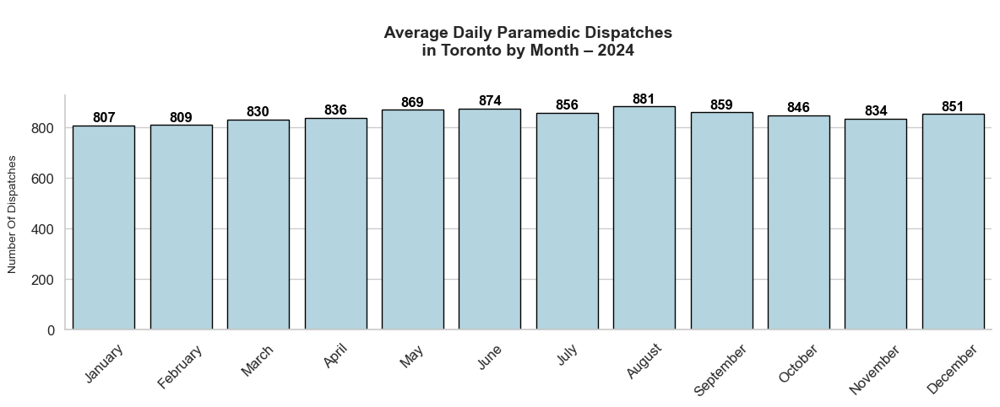

In [39]:
# Set the theme
sns.set_theme(style="whitegrid")


colors = ["#ADD8E6"] * len(aggregated_dispatch_data)
# Distinct color for each bar
colors = sns.color_palette(colors, n_colors=len(aggregated_dispatch_data))

plt.figure(figsize=(12, 5))
barplot = sns.barplot(
    data=aggregated_dispatch_data,
    x="month",
    y="daily_avg_dispatch",
    hue="month",        
    palette=colors,     
    dodge=False,       
    edgecolor="black"
)


# Annotate values
for index, row in aggregated_dispatch_data.iterrows():
    barplot.text(
        x=index,
        y=row['daily_avg_dispatch'] + 5,
        s=f"{row['daily_avg_dispatch']:.0f}",
        ha='center',
        va='bottom',
        fontsize=12,
        fontweight='bold',
        color='black'
    )

plt.title("\n Average Daily Paramedic Dispatches \n in Toronto by Month – 2024 \n   ", fontsize=14, fontweight='bold', pad=20)
plt.xlabel("", fontsize=10, labelpad=10)
plt.ylabel("Number Of Dispatches", fontsize=10, labelpad=10)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

sns.despine()
plt.tight_layout()
plt.show()

In [41]:
# units_arrived_at_scene
top_4 = paramedic_data.sort_values('units_arrived_at_scene', ascending=False).head(4)
top_4

,id,dispatch_time,incident_type,priority_category,units_arrived_at_scene,FSA,month,day,day_name,time,day_time,time_category,borough,neighborhood
277734,8730982,2024-11-20 14:09:53,Fire,Delta,16,M3M,November,20,Wednesday,14:09:53,pm,Afternoon,North York,Downsview Central
275583,8727641,2024-11-18 01:53:59,Motor Vehicle Accident,Delta,13,M3H,November,18,Monday,01:53:59,am,Night,North York,Bathurst Manor / Wilson Heights / Downsview North
1257,8309852,2024-01-02 11:05:43,Medical,Delta,13,M9W,January,2,Tuesday,11:05:43,am,Morning,Etobicoke Northwest,Clairville / Humberwood / Woodbine Downs / Wes...
265928,8713184,2024-11-06 12:40:16,Fire,Delta,12,M5M,November,6,Wednesday,12:40:16,pm,Afternoon,North York,Bedford Park / Lawrence Manor East


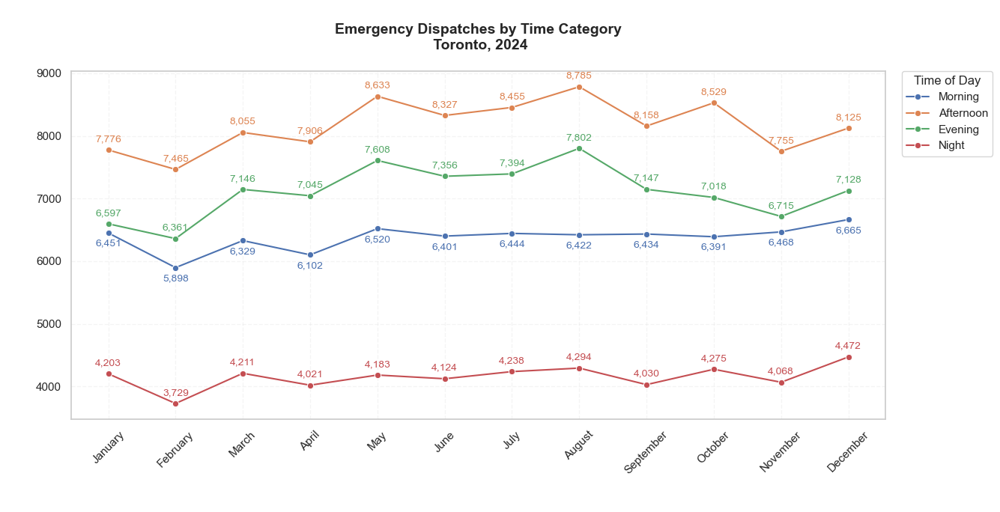

In [43]:
# Emergency Dispatches by Time Category
time_category_trend = paramedic_data.groupby(['month','time_category'], observed=True).size().reset_index(name='total_count')

time_category_trend['time_category'] = pd.Categorical(time_category_trend['time_category']
                                                      , categories=['Morning', 'Afternoon', 'Evening', 'Night']
                                                      , ordered=True)

plt.figure(figsize=(14, 7))
sns.set(style="whitegrid")

# Plot the lineplot
ax = sns.lineplot(data=time_category_trend, x='month', y='total_count', hue='time_category', marker='o')

# Format data point labels with commas
for line_idx, line in enumerate(ax.lines):
    # Set offset based on line order (first, second, etc.)
    if line_idx in [1,2, 3]:
        offset = 100
        va = 'bottom'
    else: 
        offset = -100
        va = 'top'
    for x_val, y_val in zip(line.get_xdata(), line.get_ydata()):
        ax.text(
            x_val, y_val + offset,
            f"{int(y_val):,}",
            ha='center',
            va=va,
            fontsize=10,
            color=line.get_color()
        )

# Title and axis labels
plt.title('\nEmergency Dispatches by Time Category\n Toronto, 2024\n', fontsize=14, weight='bold')
plt.xlabel('\n ')
plt.ylabel('\n ')
plt.xticks(rotation=45)
plt.tight_layout()

# Legend outside top-right
plt.legend(title='Time of Day', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

# Grid and layout
plt.grid(True, linestyle='--', alpha=0.2)
plt.subplots_adjust(right=0.85)
plt.show()

# Loading and Processing Map Data
---

In [46]:
# loading the processed map file for plotting on the map for interactive report. 
file_directory = "C:\\Users\\TITAN\\Documents\\Toronto-Ontario.geojson"
Ontario_gdf = gpd.read_file(file_directory)


Ontario_gdf = Ontario_gdf.rename(columns={'CFSAUID': 'FSA'})
Ontario_gdf['FSA'] = Ontario_gdf['FSA'].str.upper()

# Since Toronto Metropolitan Area Forward Sortation Area start with M, We should filter Toronto Data based on that
# Source: https://ised-isde.canada.ca/site/office-superintendent-bankruptcy/en/statistics-and-research/forward-sortation-area-fsa-and-north-american-industry-classification-naics-reports/forward-sortation-area-definition

toronto_gdf = Ontario_gdf.copy()
toronto_gdf = toronto_gdf[toronto_gdf['FSA'].str.contains(r'^M', case=False, na=False)].reset_index(drop=True)
toronto_gdf

,FSA,DGUID,PRUID,PRNAME,LANDAREA,geometry
0,M1B,2021A0011M1B,35,Ontario,35.3539,"MULTIPOLYGON (((-79.15955 43.83172, -79.1565 4..."
1,M1C,2021A0011M1C,35,Ontario,13.8604,"MULTIPOLYGON (((-79.13544 43.80083, -79.13531 ..."
2,M1E,2021A0011M1E,35,Ontario,15.8104,"MULTIPOLYGON (((-79.16668 43.77996, -79.16639 ..."
3,M1G,2021A0011M1G,35,Ontario,8.9669,"MULTIPOLYGON (((-79.19167 43.77843, -79.19189 ..."
4,M1H,2021A0011M1H,35,Ontario,4.4976,"MULTIPOLYGON (((-79.24178 43.77451, -79.24175 ..."
...,...,...,...,...,...,...
91,M9N,2021A0011M9N,35,Ontario,5.1476,"MULTIPOLYGON (((-79.5051 43.70754, -79.50504 4..."
92,M9P,2021A0011M9P,35,Ontario,6.7153,"MULTIPOLYGON (((-79.53805 43.70856, -79.53741 ..."
93,M9R,2021A0011M9R,35,Ontario,6.5681,"MULTIPOLYGON (((-79.55986 43.69692, -79.55947 ..."
94,M9V,2021A0011M9V,35,Ontario,15.5433,"MULTIPOLYGON (((-79.57767 43.76198, -79.57791 ..."


In [48]:
# 1. Calculate total dispatches per FSA
total_number_per_region = paramedic_data.groupby('FSA').size().reset_index(name='total_count')

# 2. Merge dispatch counts into the Ontario GeoDataFrame
map_gdf = Ontario_gdf.merge(
    total_number_per_region[['FSA', 'total_count']],
    on='FSA',
    how='left'
)

# 3. Replace missing counts with zero
map_gdf['total_count'] = map_gdf['total_count'].fillna(0)

# 4. Filter out any rows without a valid count
filtered_map = map_gdf[map_gdf['total_count'].notnull()]

# 5. Keep only FSAs starting with 'M' and reset the index
filtered_map = filtered_map[filtered_map['FSA'].str.contains(r'^M')].reset_index(drop=True)

# 6. Display the filtered GeoDataFrame
filtered_map


,FSA,DGUID,PRUID,PRNAME,LANDAREA,geometry,total_count
0,M1B,2021A0011M1B,35,Ontario,35.3539,"MULTIPOLYGON (((-79.15955 43.83172, -79.1565 4...",4907.0
1,M1C,2021A0011M1C,35,Ontario,13.8604,"MULTIPOLYGON (((-79.13544 43.80083, -79.13531 ...",2534.0
2,M1E,2021A0011M1E,35,Ontario,15.8104,"MULTIPOLYGON (((-79.16668 43.77996, -79.16639 ...",6580.0
3,M1G,2021A0011M1G,35,Ontario,8.9669,"MULTIPOLYGON (((-79.19167 43.77843, -79.19189 ...",2854.0
4,M1H,2021A0011M1H,35,Ontario,4.4976,"MULTIPOLYGON (((-79.24178 43.77451, -79.24175 ...",2468.0
...,...,...,...,...,...,...,...
91,M9N,2021A0011M9N,35,Ontario,5.1476,"MULTIPOLYGON (((-79.5051 43.70754, -79.50504 4...",4275.0
92,M9P,2021A0011M9P,35,Ontario,6.7153,"MULTIPOLYGON (((-79.53805 43.70856, -79.53741 ...",2151.0
93,M9R,2021A0011M9R,35,Ontario,6.5681,"MULTIPOLYGON (((-79.55986 43.69692, -79.55947 ...",3976.0
94,M9V,2021A0011M9V,35,Ontario,15.5433,"MULTIPOLYGON (((-79.57767 43.76198, -79.57791 ...",5581.0


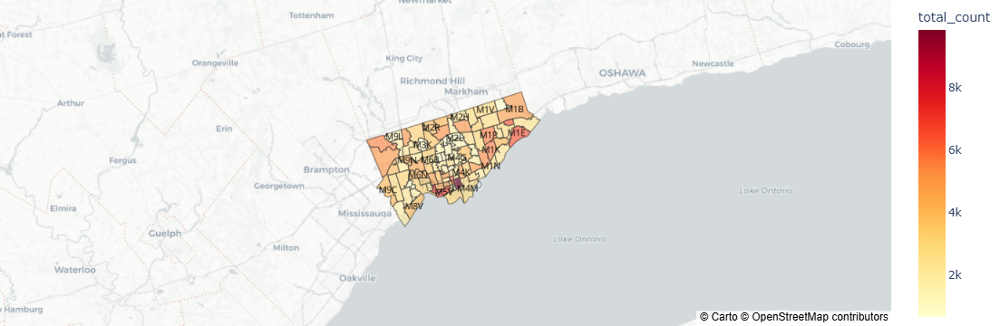

In [54]:
# 1. Load or copy your existing GeoDataFrame (assumed in EPSG:4326)
gdf = filtered_map.copy()

# 2. Reproject to a projected CRS (Web Mercator, EPSG:3857)
gdf_proj = gdf.to_crs(epsg=3857)

# 3. Compute true geometric centroids in projected space
gdf_proj["centroid"] = gdf_proj.geometry.centroid

# 4. Convert those centroids back to EPSG:4326 (lat/lon)
gdf_centroids = gdf_proj[["centroid"]].set_geometry("centroid") \
                                       .to_crs(epsg=4326)

# 5. Pull lon/lat values into your original GeoDataFrame
gdf["centroid_lon"] = gdf_centroids.geometry.x.values
gdf["centroid_lat"] = gdf_centroids.geometry.y.values

# 6. Create the choropleth map
fig = px.choropleth_mapbox(
    gdf,
    geojson=gdf.geometry,
    locations=gdf.index,
    color="total_count",
    hover_name="FSA",
    mapbox_style="carto-positron",
    center={"lat": 43.7, "lon": -79.4},
    zoom=8,
    opacity=0.6,
    color_continuous_scale="YlOrRd"
)

# 7. Overlay text labels at the centroids
fig.add_trace(go.Scattermapbox(
    lon=gdf["centroid_lon"],
    lat=gdf["centroid_lat"],
    mode="text",
    text=gdf["FSA"],
    textfont=dict(size=10, color="black"),
    showlegend=False,
    hoverinfo="skip"
))

# 8. Tidy up layout margins
fig.update_layout(margin={"r":0, "t":0, "l":0, "b":0})

# 9. Display
fig.show()

In [56]:
gdf_proj

,FSA,DGUID,PRUID,PRNAME,LANDAREA,geometry,total_count,centroid
0,M1B,2021A0011M1B,35,Ontario,35.3539,"MULTIPOLYGON (((-8812000.673 5439437.551, -881...",4907.0,POINT (-8815581.26 5437417.284)
1,M1C,2021A0011M1C,35,Ontario,13.8604,"MULTIPOLYGON (((-8809316.755 5434671.567, -880...",2534.0,POINT (-8811496.234 5432622.697)
2,M1E,2021A0011M1E,35,Ontario,15.8104,"MULTIPOLYGON (((-8812794.81 5431453.452, -8812...",6580.0,POINT (-8814894.083 5429397.136)
3,M1G,2021A0011M1G,35,Ontario,8.9669,"MULTIPOLYGON (((-8815575.896 5431217.143, -881...",2854.0,POINT (-8818361.123 5430295.185)
4,M1H,2021A0011M1H,35,Ontario,4.4976,"MULTIPOLYGON (((-8821154.186 5430613.571, -882...",2468.0,POINT (-8820909.179 5429470.757)
...,...,...,...,...,...,...,...,...
91,M9N,2021A0011M9N,35,Ontario,5.1476,"MULTIPOLYGON (((-8850467.304 5420294.894, -885...",4275.0,POINT (-8851786.473 5420177.674)
92,M9P,2021A0011M9P,35,Ontario,6.7153,"MULTIPOLYGON (((-8854135.091 5420451.107, -885...",2151.0,POINT (-8853536.379 5418329.324)
93,M9R,2021A0011M9R,35,Ontario,6.5681,"MULTIPOLYGON (((-8856562.581 5418659.041, -885...",3976.0,POINT (-8856365.583 5417223.726)
94,M9V,2021A0011M9V,35,Ontario,15.5433,"MULTIPOLYGON (((-8858545.525 5428681.545, -885...",5581.0,POINT (-8860405.05 5425714.453)


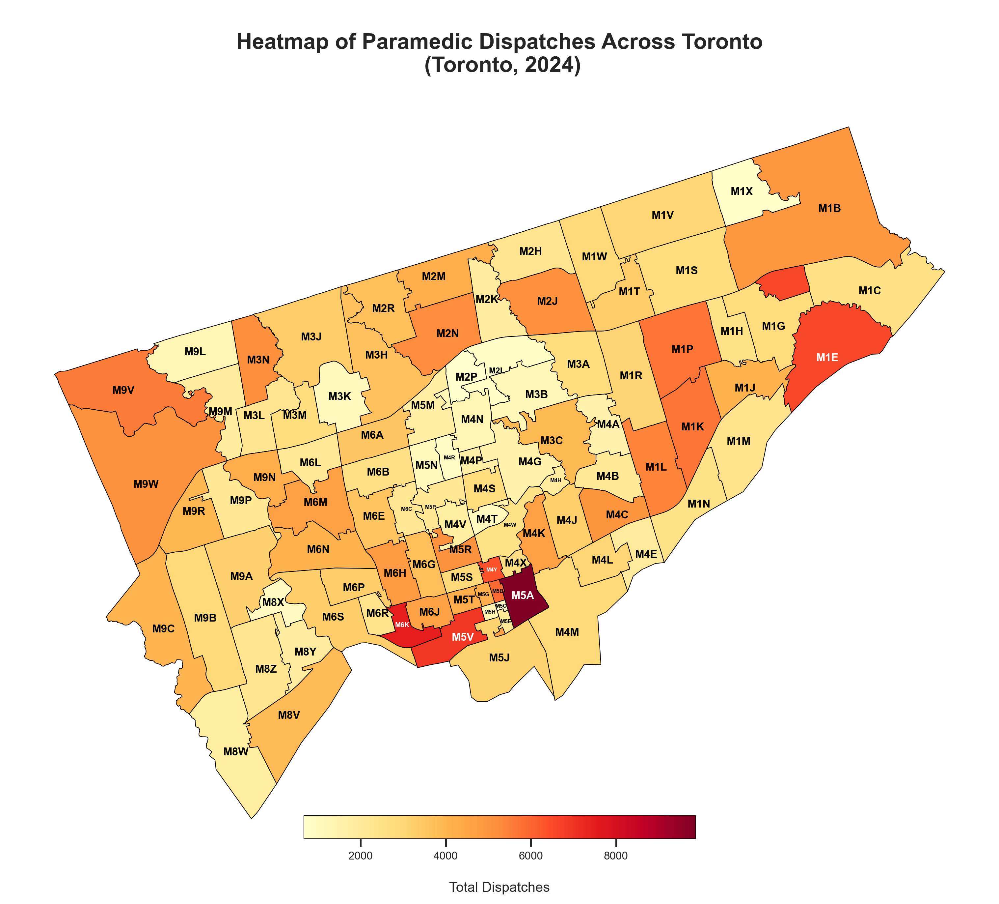

In [156]:
# 1. Reproject your map to lat/lon
gdf = filtered_map.to_crs(epsg=4326)

# 2. Get a point inside each polygon for label placement
gdf["label_pt"] = gdf.geometry.representative_point()
gdf["lx"] = gdf.label_pt.x
gdf["ly"] = gdf.label_pt.y

# 3. Measure true area (m²) by projecting to Web‑Mercator
gdf_metric = gdf.to_crs(epsg=3857)
gdf["area_m2"] = gdf_metric.geometry.area

# 4. Font‑size by area (tiny, medium, large)
def fontsize_for_area(area):
    if area < 1e6:
        return 4
    elif area < 3e6:
        return 6
    else:
        return 8

gdf["fontsize"] = gdf["area_m2"].apply(fontsize_for_area)

# 5. Normalize total_count to pick label color
vmin, vmax = gdf.total_count.min(), gdf.total_count.max()
gdf["norm"] = (gdf.total_count - vmin) / (vmax - vmin)
gdf["label_color"] = gdf["norm"].apply(lambda x: "white" if x > 0.6 else "black")

# 6. Start a figure with constrained_layout enabled
fig, ax = plt.subplots(
    figsize=(10, 10),
    dpi=300,
    constrained_layout=True
)

# 7. Draw the choropleth
gdf.plot(
    column="total_count",
    cmap="YlOrRd",
    edgecolor="black",
    linewidth=0.5,
    ax=ax
)

# 8. Remove axes
ax.set_axis_off()

# 9. Add FSA labels
manual_sizes = {
    "M5B": 4, "M5G": 4, "M5H": 4, "M5P": 4,
    "M6C": 4, "M4Y": 4, "M4H": 4, "M5C": 4,
    "M4R": 4, "M2L": 6, "M6K": 5, "M4W": 4,
    "M5E": 4  
}
default_size = 8

for _, row in gdf.iterrows():
    fs = manual_sizes.get(row["FSA"], default_size)
    ax.text(
        row["lx"], row["ly"], row["FSA"],
        ha="center", va="center",
        fontsize=fs,
        fontweight="bold",
        color=row["label_color"],
        clip_on=True
    )

# 10. Add inset horizontal colorbar
norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(norm=norm, cmap="YlOrRd")
sm._A = []

cax = inset_axes(
    ax,
    width="40%",    
    height="3%",   
    loc="lower center",
    borderpad=1
)

cb = fig.colorbar(sm, cax=cax, orientation="horizontal")
cb.set_label("\nTotal Dispatches", fontsize=10, labelpad=4)
cb.ax.tick_params(labelsize=8)
cb.outline.set_edgecolor("black")
cb.outline.set_linewidth(0.25)

# 11. Title
ax.set_title(
    "\n Heatmap of Paramedic Dispatches Across Toronto \n (Toronto, 2024)",
    fontsize=16,
    fontweight="bold",
    pad=15
)

# 12. Save with bbox_inches="tight" (no need for tight_layout)
fig.savefig(
    "toronto_dispatch_map.jpeg",
    format="jpeg",
    dpi=300,
    bbox_inches="tight",
    pad_inches=0
)

plt.show()


# Phase 6: Reporting & Recommendations
-------------------------------------
- Provide actionable insights:
  - When and where more paramedic units are needed.
  - Optimal staffing strategies by time/day/location.

## 1. Overall Volume Trends

- **Monthly Seasonality:** Dispatch volumes climb steadily from winter to summer, peaking in **August** at **27,303** calls (an average of **881** per day). May–August all average above **850** calls per day, compared with **807–836** in early months and dipping back to **834** in November.  
- **Weekday Patterns:** **Tuesdays** lead with **855** calls on average, while **Saturdays** and **Sundays** are lighter at **835** and **827** calls, respectively.  
- **Time-of-Day Split:** Afternoon and evening hours dominate. Each month, **PM dispatches** average about **15,289** calls versus **10,516** in **AM**, highlighting the need for stronger coverage in the latter half of each day.

## 2. Daily Peak Events

Every month’s busiest day falls in the PM period:

- **August:** Friday afternoons by **4,516** calls in total.  
- **May:** Thursday afternoons by **4,431** calls in total.  
- **February:** The highest-volume was Thursday afternoons with **4,186** calls in total—the lowest among the monthly peaks.

## 3. Time of Day Trend

Some patterns stay steady. **Night** and **Morning** dispatches barely moved—consistently flat, season after season except a minor shift in Winter.

But the real changes happen later in the day:

- **Afternoon** is the peak zone. It ramps up with **7,906** calls in April, then a sharp jump to **8,600** in **May**. Through the summer months, it stays above **8,300**, then begins its descent after August. The rhythm of warm days, busy streets, and rising demand is clear.

- **Evening** follows closely. It mirrors the Afternoon curve, climbing from **7,045** in April to **7,608** in May. Same seasonality, slightly lower volume, but the pattern holds: more daylight, more movement, more emergencies.


## 4. Geographic Hotspots – Highest Number of Dispatches

Downtown neighbourhoods dominate:

1. **Regent Park / Harbourfront** – ~**10,000** dispatches  
2. **Brockton–Parkdale Village–Exhibition Place** – ~**7,500** dispatches  
3. Other central areas round out the top five, underscoring persistent downtown demand.

---

### The Most Critical Incidents of The Year

- **Nov 20, 2:10 p.m.:** A fire in Downsview Central, classified **Delta***, prompted **16** units.  
- **Nov 18:** A Delta-level motor-vehicle collision in Bathurst Manor / Wilson Heights / Downsview North dispatched **13** units.  
- **Jan 2:** A medical emergency required **13** units.

*Taken from https://www.torontoparamedic.com/communications/

---

## Recommendations

### Bolster PM Shift Staffing, Especially in Summer

- **When:** PM shifts, **May–August**  
- **Where:** Regent Park / Harbourfront and Parkdale / Exhibition Place  

### Allocate Additional Units on Tuesdays

- **When:** Tuesday afternoons, averaging **>850** dispatches  
- **How:** Deploy flexible reserve crews or on-call units when demand spikes  

### Implement Dynamic Mid-Week Summer Coverage

- **Strategy:** Shift resources from low-demand mornings and Sundays into Tuesday–Friday afternoons, aligning staff with predictable mid-week peaks.
